In [152]:
from ecg_qc import ecg_qc
import time
import numpy as np
import matplotlib.pyplot as plt
from joblib import load
from dtreeviz.trees import dtreeviz
import pandas as pd
from sklearn import tree
from streamlit_visualization.modules.graph_generation import annot_classification_correspondance
import seaborn as sns

In [3]:
ecg_qc_test = ecg_qc(model='model_2s_rfc_normalized_premium.pkl',
                     normalized=False)

model = ecg_qc_test.model.best_estimator_
forest = model

sqi_names = ['q_sqi_score', 'c_sqi_score', 's_sqi_score',
             'k_sqi_score', 'p_sqi_score', 'bas_sqi_score']
feature_names = sqi_names

[0.04517524 0.09664645 0.10615024 0.15173222 0.34559637 0.25469948]


/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/scikit_learn-0.24.1-py3.6-linux-x86_64.egg/sklearn/base.py:315: UserWarning: Trying to unpickle estimator StandardScaler from version 0.23.2 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/scikit_learn-0.24.1-py3.6-linux-x86_64.egg/sklearn/base.py:315: UserWarning: Trying to unpickle estimator OneHotEncoder from version 0.23.2 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/scikit_learn-0.24.1-py3.6-linux-x86_64.egg/sklearn/base.py:315: UserWarning: Trying to unpickle estimator ColumnTransformer from version 0.23.2 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
/home/aura-ale

In [4]:
start_time = time.time()
importances = forest.feature_importances_
std = np.std([
    tree.feature_importances_ for tree in forest.estimators_], axis=0)
elapsed_time = time.time() - start_time

print(f"Elapsed time to compute the importances: "
      f"{elapsed_time:.3f} seconds")

Elapsed time to compute the importances: 0.009 seconds


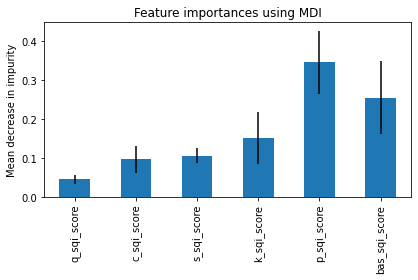

In [5]:
import pandas as pd
forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [6]:
forest.estimators_

[DecisionTreeClassifier(max_depth=14, max_features='auto',
                        random_state=1536690446),
 DecisionTreeClassifier(max_depth=14, max_features='auto', random_state=40851092),
 DecisionTreeClassifier(max_depth=14, max_features='auto',
                        random_state=1749063235),
 DecisionTreeClassifier(max_depth=14, max_features='auto',
                        random_state=306112940),
 DecisionTreeClassifier(max_depth=14, max_features='auto',
                        random_state=619377156),
 DecisionTreeClassifier(max_depth=14, max_features='auto',
                        random_state=1220532774),
 DecisionTreeClassifier(max_depth=14, max_features='auto',
                        random_state=1457686600),
 DecisionTreeClassifier(max_depth=14, max_features='auto',
                        random_state=281450722),
 DecisionTreeClassifier(max_depth=14, max_features='auto',
                        random_state=160336782),
 DecisionTreeClassifier(max_depth=14, max_feature

In [7]:
forest.estimators_[0].feature_importances_

array([0.0521186 , 0.10509971, 0.14717988, 0.28167619, 0.2835635 ,
       0.13036213])

In [32]:

 # remember to load the package


target_id = '103001_selection'
df_ecg = pd.read_pickle(
        'dataset_streamlit/df_ecg_{}.pkl'.format(
            target_id))

def load_edf(edf_file: str,
             channel: str,
             start: int = 0,
             n: int = 10_000):
    with edfreader.EdfReader(edf_file) as f:
        signals = f.readSignal(channel, start=start, n=n)
    df_ecg = pd.DataFrame(data=signals, columns=[channel])
    return df_ecg

def load_annot():
    df = 1000
    df_ann = pd.read_csv('dataset_streamlit/{}_ANN.csv'.format(target_id),
                         header=None)
    print(df_ann)

    df_ann.columns = ['anno1_start_sample', 'anno1_end_sample', 'anno1_tag',
                      'anno2_start_sample', 'anno2_end_sample', 'anno2_tag',
                      'anno3_start_sample', 'anno3_end_sample', 'anno3_tag',
                      'cons_start_sample', 'cons_end_sample', 'cons_tag']

    targets = ['anno1_start_sample', 'anno1_end_sample',
               'anno2_start_sample', 'anno2_end_sample',
               'anno3_start_sample', 'anno3_end_sample',
               'cons_start_sample', 'cons_end_sample']

    for target in targets:
        df_ann[target] = df_ann[target] / fs

    df_ann = df_ann[
        (df_ann['cons_start_sample'] >= (df_ecg.index[0] / fs))
        ].fillna(0)

    df_ann.reset_index(drop=True, inplace=True)

    return df_ann

fs = 1_000
df_ann = load_annot()
frame_window_selection = 16
time_window_ml = 2

from streamlit_visualization.modules.graph_generation import ecg_qc_predict
import math

def start_frame_definition():
    df_start_frame = load('streamlit_visualization/next.pkl')
    start_frame = df_start_frame.iloc[0][0]
    return df_start_frame, start_frame

df_start_frame, start_frame = start_frame_definition()

frame_start_selection = int(round(df_ecg.index.values[0]/fs, 0))

# start_frame = frame_start_selection * fs
# end_frame = start_frame + frame_window_selection * fs

# df_ecg = df_ecg[(df_ecg.index >= start_frame) & (df_ecg.index < end_frame)]

def ecg_qc_wrapper(ecg_data: np.ndarray,
                   time_window_ml: int = 2,
                   fs: int = 1_000,
                   normalized: bool = False) -> np.ndarray:

    ecg_qc_test = ecg_qc(model='model_2s_rfc_normalized_premium.pkl',
                         normalized=normalized)

    classif_ecg_qc_data = []
    sqis_data = []

    for start in range(
            math.floor(len(ecg_data)/(fs * time_window_ml)) + 1):

        start = start * fs * time_window_ml
        end = start + fs * time_window_ml
        ecg_signal = np.array(ecg_data[start:end])

        signal_quality = ecg_qc_test.get_signal_quality(ecg_signal)
        classif_ecg_qc_data.append(signal_quality)

        sqis = ecg_qc_test.compute_sqi_scores(ecg_signal)[0]
        sqis_data.append(sqis)

    return classif_ecg_qc_data, sqis_data

ecg_data = df_ecg['ecg_signal'].values
classif_ecg_qc_ml_data, sqis_data = ecg_qc_wrapper(
    ecg_data=ecg_data,
    time_window_ml=time_window_ml,
    fs=fs,
    normalized=False)

X = pd.DataFrame(sqis_data).values
y_pred = np.array(classif_ecg_qc_ml_data)

# true y

df_ann  = df_ann['cons_tag'].apply(lambda x: annot_classification_correspondance(x))


             0           1    2           3           4    5         6   \
0           1.0  28800000.0  0.0         1.0  28800000.0  0.0         1   
1    28800001.0  28975762.0  1.0  28800001.0  28975824.0  1.0  28800001   
2    28975763.0  28983465.0  2.0  28975825.0  28982573.0  2.0  28975433   
3    28983466.0  29407881.0  1.0  28982574.0  29408482.0  1.0  28983490   
4    29407882.0  29416453.0  2.0  29408483.0  29415214.0  2.0  29408341   
..          ...         ...  ...         ...         ...  ...       ...   
191         NaN         NaN  NaN         NaN         NaN  NaN  58686312   
192         NaN         NaN  NaN         NaN         NaN  NaN  58690011   
193         NaN         NaN  NaN         NaN         NaN  NaN  58700465   
194         NaN         NaN  NaN         NaN         NaN  NaN  58701284   
195         NaN         NaN  NaN         NaN         NaN  NaN  58800001   

           7   8           9           10   11  
0    28800000   0         1.0  28800000.0  0.0  
1

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/scikit_learn-0.24.1-py3.6-linux-x86_64.egg/sklearn/base.py:315: UserWarning:

Trying to unpickle estimator StandardScaler from version 0.23.2 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/scikit_learn-0.24.1-py3.6-linux-x86_64.egg/sklearn/base.py:315: UserWarning:

Trying to unpickle estimator OneHotEncoder from version 0.23.2 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/scikit_learn-0.24.1-py3.6-linux-x86_64.egg/sklearn/base.py:315: UserWarning:

Trying to unpickle estimator ColumnTransformer from version 0.23.2 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3

In [33]:
len(y_pred)

600

In [39]:
ecg_qc_test

In [35]:
df_validation = pd.read_csv('/home/aura-alexis/github/ecg_qc/datasets/2_dataset_creation/df_ml_103001.csv')

In [36]:
df_validation.head()

,timestamp_start,timestamp_end,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score,classif,classif_avg
0,28800001,28802000,0.500,0.768,3.127,11.738,0.510,0.985,1,1.0
1,28802001,28804000,1.000,0.672,3.325,13.034,0.519,0.967,1,1.0
2,28804001,28806000,1.000,0.588,3.772,16.345,0.513,0.967,1,1.0
3,28806001,28808000,0.500,0.000,3.122,12.985,0.526,0.971,1,1.0
4,28808001,28810000,0.667,1.164,3.114,11.619,0.518,0.952,1,1.0


In [62]:
ecg_qc_test = ecg_qc(model='model_2s_rfc_normalized_premium.pkl',
                         normalized=False)
df_validation['ecg_qc_pred'] = ecg_qc_test.predict_quality(df_validation.iloc[:, 2:8].values)

[0.04517524 0.09664645 0.10615024 0.15173222 0.34559637 0.25469948]


/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/scikit_learn-0.24.1-py3.6-linux-x86_64.egg/sklearn/base.py:315: UserWarning:

Trying to unpickle estimator StandardScaler from version 0.23.2 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/scikit_learn-0.24.1-py3.6-linux-x86_64.egg/sklearn/base.py:315: UserWarning:

Trying to unpickle estimator OneHotEncoder from version 0.23.2 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/scikit_learn-0.24.1-py3.6-linux-x86_64.egg/sklearn/base.py:315: UserWarning:

Trying to unpickle estimator ColumnTransformer from version 0.23.2 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3

In [67]:
X = df_validation.iloc[:, 2:8].values
y_pred = df_validation['ecg_qc_pred'].tolist()
y_true = np.array(df_validation['classif'].values)

In [71]:
X[0]

array([ 0.5  ,  0.768,  3.127, 11.738,  0.51 ,  0.985])

In [68]:

viz = dtreeviz(forest.estimators_[0], X, y_true,
                target_name='quality',
                feature_names=feature_names,
                class_names=['noise', 'clean'])

viz.save('viz_tree_103001.svg')

kmeans 0
count : 111
0    0.513514
1    0.486486
Name: classif, dtype: float64
0.6708860759493671
0.5315315315315315


kmeans 1
count : 90
0    0.733333
1    0.266667
Name: classif, dtype: float64
0.5217391304347827
0.6333333333333333


/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).





kmeans 2
count : 444
1    0.536036
0    0.463964
Name: classif, dtype: float64
0.6130653266331658
0.4797297297297297


kmeans 3
count : 426
1    0.830986
0    0.169014
Name: classif, dtype: float64
0.8891855807743658
0.8051643192488263


/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).





kmeans 4
count : 129
1    0.968992
0    0.031008
Name: classif, dtype: float64
0.29729729729729726
0.1937984496124031




/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



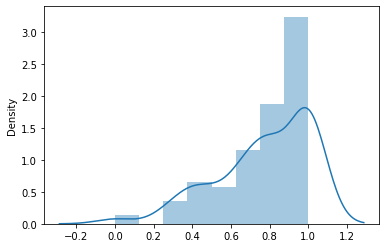

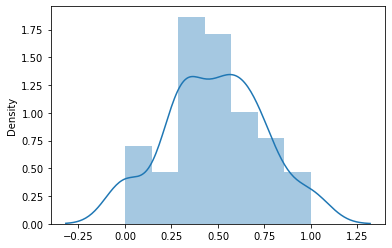

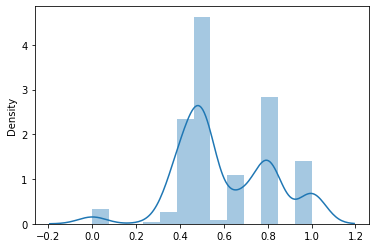

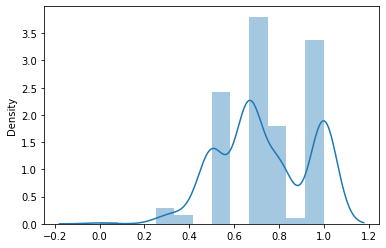

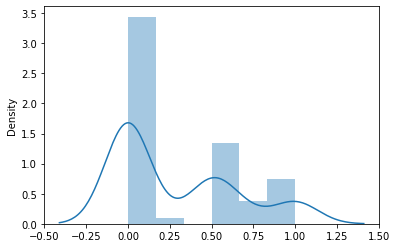

In [176]:
for kmean in range(5):
    print(f'kmeans {kmean}')

    df_temp = df_validation[df_validation['kmeans'] == kmean]
    X_temp = df_temp.iloc[:,2:8].values
    print(f'count : {df_temp.shape[0]}')
    print(df_temp['classif'].value_counts()/df_temp.shape[0])
    y_true_temp = np.array(df_temp['classif'].values)
    print(f1_score(y_true_temp, forest.estimators_[0].predict(X_temp)))
    print(accuracy_score(y_true_temp, forest.estimators_[0].predict(X_temp)))
    dis = plt.figure()
    dis = sns.distplot(df_temp['qSQI_score'].values)
    print('\n')

In [161]:
df_validation[df_validation['kmeans'] == 0]

,timestamp_start,timestamp_end,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score,classif,classif_avg,ecg_qc_pred,kmeans
2,28804001,28806000,1.000,0.588,3.772,16.345,0.513,0.967,1,1.0,1,0
32,28864001,28866000,0.667,1.403,3.267,13.217,0.436,0.927,1,1.0,1,0
52,28904001,28906000,1.000,0.000,3.183,12.400,0.439,0.979,1,1.0,1,0
54,28908001,28910000,1.000,0.673,3.682,15.837,0.506,0.950,1,1.0,1,0
62,28924001,28926000,0.800,0.618,3.944,17.471,0.507,0.948,1,1.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1146,58692181,58694180,0.333,0.907,3.510,15.564,0.458,0.871,0,0.0,1,0
1172,58744181,58746180,0.571,0.486,2.639,8.788,0.487,0.985,0,0.0,1,0
1174,58748181,58750180,1.000,0.575,2.948,11.207,0.458,0.944,0,0.0,1,0
1176,58752181,58754180,1.000,0.572,4.072,17.966,0.453,0.987,0,0.0,1,0


True :0
False :1


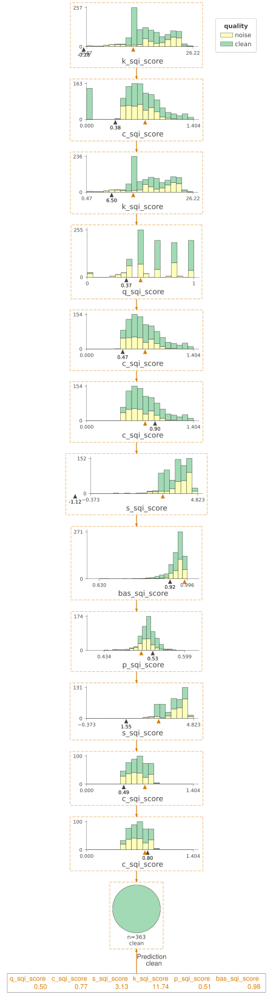

In [145]:
# Decision Path

print(f'True :{df_wrong_answers["classif"].values[0]}')
print(f'False :{df_wrong_answers["ecg_qc_pred"].values[0]}')

viz = dtreeviz(forest.estimators_[0], X, y_true,
                target_name='quality',
                feature_names=feature_names,
                class_names=['noise', 'clean'],
                X=X[0],
                show_just_path=True)

viz

In [75]:
# Decision Path


viz = dtreeviz(forest.estimators_[0], X, y_true,
                target_name='quality',
                feature_names=feature_names,
                class_names=['noise', 'clean'],
                X=X[0],
                show_just_path=True)

viz.save('viz_tree_103001_pred.svg')

In [85]:
from sklearn.metrics import f1_score, accuracy_score

In [86]:
f1_score(y_true, y_pred)

0.7969924812030075

In [87]:
accuracy_score(y_true, y_pred)

0.6625

In [83]:
df_validation['classif'].value_counts()/df_validation.shape[0]

1    0.6625
0    0.3375
Name: classif, dtype: float64

In [90]:
df_wrong_answers = df_validation[df_validation['classif'] != df_validation['ecg_qc_pred']]

In [94]:
df_wrong_answers.iloc[:,2:8].values

array([[ 0.8  ,  0.784,  3.175, 12.127,  0.558,  0.964],
       [ 0.   ,  0.765,  2.276,  7.542,  0.487,  0.889],
       [ 0.   ,  0.42 , -0.126,  1.498,  0.499,  0.734],
       ...,
       [ 0.75 ,  0.666,  3.085, 10.528,  0.518,  0.948],
       [ 0.333,  0.528,  2.802, 10.864,  0.527,  0.939],
       [ 0.4  ,  0.725,  3.564, 13.994,  0.501,  0.926]])

In [141]:
regr = tree.DecisionTreeClassifier(max_depth=10)
regr.fit(X, y_true)
print(f1_score(y_true, regr.predict(X)))
print(accuracy_score(y_true, regr.predict(X)))

0.9460154241645244
0.93


In [142]:
viz = dtreeviz(regr, X, y_true,
                target_name='quality',
                feature_names=feature_names,
                class_names=['noise', 'clean'])

viz

True :0
False :[0]


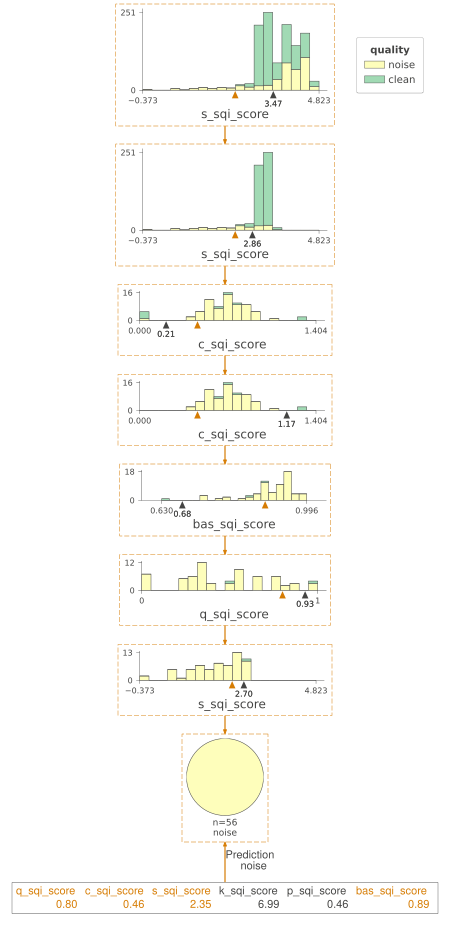

In [135]:
# Decision Path
n = 5
x_ex = df_wrong_answers.iloc[:,2:8].values[n]
print(f'True :{df_wrong_answers["classif"].values[n]}')
print(f'False :{regr.predict([x_ex])}')
viz = dtreeviz(regr, X, y_true,
                target_name='quality',
                feature_names=feature_names,
                class_names=['noise', 'clean'],
                X=df_wrong_answers.iloc[:,2:8].values[5],
                show_just_path=True)
viz

In [127]:
# Decision Path

print(f'True :{df_wrong_answers["classif"].values[0]}')
print(f'False :{df_wrong_answers["ecg_qc_pred"].values[0]}')
viz = dtreeviz(forest.estimators_[0], X, y_true,
                target_name='quality',
                feature_names=feature_names,
                class_names=['noise', 'clean'],
                X=df_wrong_answers.iloc[:,2:8].values[0],
                show_just_path=True)
viz.view()

True :0
False :1


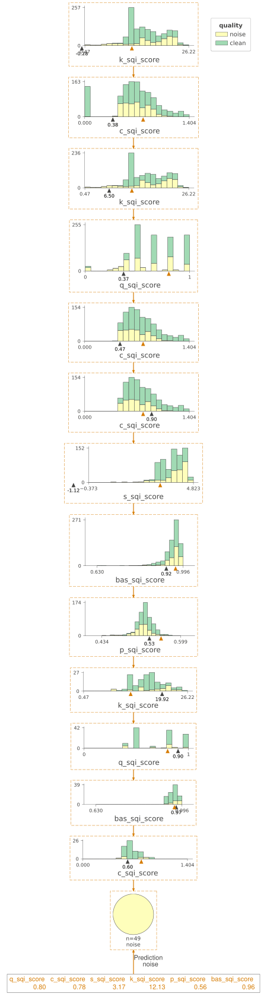

In [105]:
viz

<AxesSubplot:>

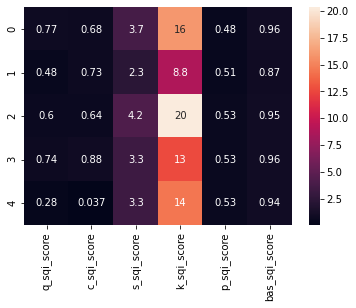

In [158]:
# Kmeans
# Import Standard Scaler
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Initialize StandardScaler
# StandardScaler will substract mean and divide by standard deviation to each observation
sc = StandardScaler()

# Apply StandardScaler to X
X_kmeans = sc.fit_transform(X)


kmeans = KMeans(n_clusters=5, random_state=0, init="k-means++")
# Fit kmeans to our dataset
kmeans.fit(X_kmeans)


# Cluster centers coordinates
# Let's use inverse transform to have the real coordinates 
cluster_centers = sc.inverse_transform(kmeans.cluster_centers_)


# Create a heatmap 
sns.heatmap(pd.DataFrame(cluster_centers, columns=sqi_names),  annot=True)

In [159]:
df_validation['kmeans'] = kmeans.predict(X_kmeans)

In [154]:
# Let's create a loop that will collect the Within-sum-of-square (wcss) for each value K 
# Let's use .inertia_ parameter to get the within sum of square value for each value K 
wcss =  []
k = []
for i in range (1,11): 
    kmeans = KMeans(n_clusters= i, init = "k-means++", random_state = 0)
    kmeans.fit(X_kmeans)
    wcss.append(kmeans.inertia_)
    k.append(i)
    print("WCSS for K={} --> {}".format(i, wcss[-1]))


WCSS for K=1 --> 7199.999999999986
WCSS for K=2 --> 5590.877292070557
WCSS for K=3 --> 4649.149397038799
WCSS for K=4 --> 4025.6507442546445
WCSS for K=5 --> 3533.3076943984274
WCSS for K=6 --> 3256.8967442507587
WCSS for K=7 --> 3017.9746350366536
WCSS for K=8 --> 2810.177357283063
WCSS for K=9 --> 2615.158358247438
WCSS for K=10 --> 2460.7079432553905


In [155]:
import plotly.express as px

# Create DataFrame
wcss_frame = pd.DataFrame(wcss)
k_frame = pd.Series(k)

# Create figure
fig= px.line(
    wcss_frame,
    x=k_frame,
    y=wcss_frame.iloc[:,-1]
)

# Create title and axis labels
fig.update_layout(
    yaxis_title="Inertia",
    xaxis_title="# Clusters",
    title="Inertia per cluster"
)

# Render
#fig.show(renderer="notebook")
fig.show(renderer="iframe") # if using workspace

# Decision Tree

In [40]:
fig = plt.figure(figsize=(150,150))
_ = tree.plot_tree(forest.estimators_[0], 
                   feature_names=feature_names,
                   filled=True)
